Dimensional reduction meanse Reduce the number of input variables or features in a dataset while preserving the most important information. The primary goal of dimensional reduction is to simplify the dataset by representing it in a lower-dimensional space, which can make it easier to visualize, analyze, and process the data, while potentially reducing the risk of overfitting in machine learning models.

In [1]:
import pandas as pd
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('credit card.csv')
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [3]:
df.shape

(30000, 25)

In [4]:
df.isnull().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

In [5]:
df.nunique()

ID                            30000
LIMIT_BAL                        81
SEX                               2
EDUCATION                         7
MARRIAGE                          4
AGE                              56
PAY_0                            11
PAY_2                            11
PAY_3                            11
PAY_4                            11
PAY_5                            10
PAY_6                            10
BILL_AMT1                     22723
BILL_AMT2                     22346
BILL_AMT3                     22026
BILL_AMT4                     21548
BILL_AMT5                     21010
BILL_AMT6                     20604
PAY_AMT1                       7943
PAY_AMT2                       7899
PAY_AMT3                       7518
PAY_AMT4                       6937
PAY_AMT5                       6897
PAY_AMT6                       6939
default.payment.next.month        2
dtype: int64

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [7]:
df = df.rename(columns={'default.payment.next.month':'payment'})
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,payment
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [8]:
x=df.drop(['ID','payment'],axis=1)

In [9]:
y=df[['payment']]

In [10]:
y.value_counts()

payment
0          23364
1           6636
Name: count, dtype: int64

In [11]:
23364 / (23364+6636)

0.7788

Wrapper Method - Recursive Feature Elimination (RFE) in Python
Wrapper methods in feature selection involve evaluating different subsets of features by training and evaluating a machine learning model. You can perform wrapper feature selection using a simple wrapper method called Recursive Feature Elimination (RFE) in Python

In [12]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [13]:
classifier = LogisticRegression()

In [14]:
# create an instance of recursive feature elimination with logistic regression
rfe = RFE(estimator= classifier, n_features_to_select =10) #rank calculation kre je kon feature ta nite hbe

Fit RFE for your data

In [15]:
rfe.fit(x,y)

RFE(estimator=LogisticRegression(), n_features_to_select=10)

In [16]:
selected_feature =rfe.support_
feature_rank = rfe.ranking_

In [17]:
feature_rank

array([ 8,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  7, 14, 13,  6, 12, 10,
        2,  3,  5,  4, 11,  9])

In [18]:
# Print the selected features and their ranks
for feature,rank in zip(x.columns,feature_rank):
    print(f'feature:{feature},rank:{rank}')

feature:LIMIT_BAL,rank:8
feature:SEX,rank:1
feature:EDUCATION,rank:1
feature:MARRIAGE,rank:1
feature:AGE,rank:1
feature:PAY_0,rank:1
feature:PAY_2,rank:1
feature:PAY_3,rank:1
feature:PAY_4,rank:1
feature:PAY_5,rank:1
feature:PAY_6,rank:1
feature:BILL_AMT1,rank:7
feature:BILL_AMT2,rank:14
feature:BILL_AMT3,rank:13
feature:BILL_AMT4,rank:6
feature:BILL_AMT5,rank:12
feature:BILL_AMT6,rank:10
feature:PAY_AMT1,rank:2
feature:PAY_AMT2,rank:3
feature:PAY_AMT3,rank:5
feature:PAY_AMT4,rank:4
feature:PAY_AMT5,rank:11
feature:PAY_AMT6,rank:9


In [19]:
rfe.score(x,y)

0.8099

L1 regularization (Lasso)¶

In [20]:
# Create an instance of the classifier with L1 regularization (Lasso)
#https://towardsdatascience.com/l1-and-l2-regularization-methods-ce25e7fc831c

classifier = LogisticRegression(penalty='l1', solver='liblinear')

# Fit the classifier to your data
classifier.fit(x, y)  # x/X_train: Input features, y/y_train: Target variable

# Retrieve the coefficients (weights) of the features
coefficients = classifier.coef_

In [21]:
# Print the coefficients and corresponding feature names
for feature, coefficient in zip(x.columns, coefficients[0]):
    print(f'Feature: {feature}, Coefficient: {coefficient}')

Feature: LIMIT_BAL, Coefficient: -7.665288233184049e-07
Feature: SEX, Coefficient: -0.11022851282345154
Feature: EDUCATION, Coefficient: -0.102043468543986
Feature: MARRIAGE, Coefficient: -0.1569695493076102
Feature: AGE, Coefficient: 0.00723344076619761
Feature: PAY_0, Coefficient: 0.5771128264086473
Feature: PAY_2, Coefficient: 0.0827015907717084
Feature: PAY_3, Coefficient: 0.07208700692093797
Feature: PAY_4, Coefficient: 0.02383954670932605
Feature: PAY_5, Coefficient: 0.03397279437644292
Feature: PAY_6, Coefficient: 0.00801010350004061
Feature: BILL_AMT1, Coefficient: -5.462066063407061e-06
Feature: BILL_AMT2, Coefficient: 2.3037604750259956e-06
Feature: BILL_AMT3, Coefficient: 1.3913523448997686e-06
Feature: BILL_AMT4, Coefficient: -1.8271495372438638e-07
Feature: BILL_AMT5, Coefficient: 6.056639194693871e-07
Feature: BILL_AMT6, Coefficient: 4.0336510209599563e-07
Feature: PAY_AMT1, Coefficient: -1.3612908644745582e-05
Feature: PAY_AMT2, Coefficient: -9.64853304733567e-06
Feature

In [22]:
from sklearn.ensemble import ExtraTreesClassifier #decision tree

In [23]:
extr = ExtraTreesClassifier()

In [24]:
extr.fit(x,y)

ExtraTreesClassifier()

In [25]:
extr.feature_importances_ # IG from decision tree

array([0.06597084, 0.01182411, 0.03253379, 0.02120915, 0.06694649,
       0.09477283, 0.05042817, 0.03457042, 0.02726582, 0.03141368,
       0.0291748 , 0.05036176, 0.04689486, 0.0449394 , 0.04468753,
       0.04393149, 0.04413105, 0.0442408 , 0.042325  , 0.04218272,
       0.04136065, 0.04243557, 0.04639907])

In [26]:
feature_importance = extr.feature_importances_
feature_importance #info gain

array([0.06597084, 0.01182411, 0.03253379, 0.02120915, 0.06694649,
       0.09477283, 0.05042817, 0.03457042, 0.02726582, 0.03141368,
       0.0291748 , 0.05036176, 0.04689486, 0.0449394 , 0.04468753,
       0.04393149, 0.04413105, 0.0442408 , 0.042325  , 0.04218272,
       0.04136065, 0.04243557, 0.04639907])

In [27]:
imp = pd.DataFrame(feature_importance,columns=['Gain_Score'])
imp #.head()

,Gain_Score
0,0.065971
1,0.011824
2,0.032534
3,0.021209
4,0.066946
5,0.094773
6,0.050428
7,0.034570
8,0.027266
9,0.031414


In [28]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [29]:
cols = pd.DataFrame(x.columns, columns=['feature_Names'])
cols

,feature_Names
0,LIMIT_BAL
1,SEX
2,EDUCATION
3,MARRIAGE
4,AGE
5,PAY_0
6,PAY_2
7,PAY_3
8,PAY_4
9,PAY_5


In [30]:
gains = pd.concat([cols,imp],axis=1)
gains.head()

,feature_Names,Gain_Score
0,LIMIT_BAL,0.065971
1,SEX,0.011824
2,EDUCATION,0.032534
3,MARRIAGE,0.021209
4,AGE,0.066946


In [31]:
gains.nlargest(15,'Gain_Score') #smallest

,feature_Names,Gain_Score
5,PAY_0,0.094773
4,AGE,0.066946
0,LIMIT_BAL,0.065971
6,PAY_2,0.050428
11,BILL_AMT1,0.050362
12,BILL_AMT2,0.046895
22,PAY_AMT6,0.046399
13,BILL_AMT3,0.044939
14,BILL_AMT4,0.044688
17,PAY_AMT1,0.044241


In [32]:
gains.nsmallest(8,'Gain_Score')

,feature_Names,Gain_Score
1,SEX,0.011824
3,MARRIAGE,0.021209
8,PAY_4,0.027266
10,PAY_6,0.029175
9,PAY_5,0.031414
2,EDUCATION,0.032534
7,PAY_3,0.034570
20,PAY_AMT4,0.041361


In [33]:
newx = gains.nlargest(18,'Gain_Score')
newx

,feature_Names,Gain_Score
5,PAY_0,0.094773
4,AGE,0.066946
0,LIMIT_BAL,0.065971
6,PAY_2,0.050428
11,BILL_AMT1,0.050362
12,BILL_AMT2,0.046895
22,PAY_AMT6,0.046399
13,BILL_AMT3,0.044939
14,BILL_AMT4,0.044688
17,PAY_AMT1,0.044241


<Axes: >

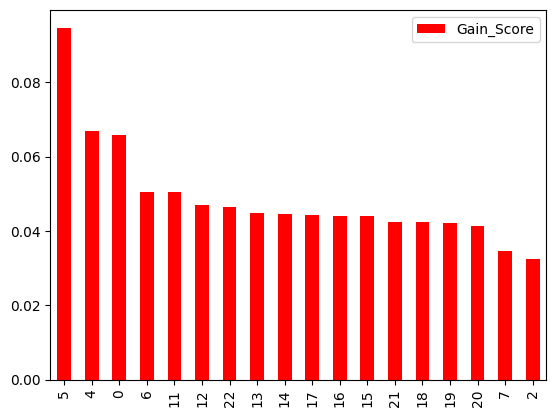

In [34]:
newx.plot(kind ='bar',color=['red'])

In [35]:
x.shape

(30000, 23)

In [36]:
import matplotlib.pyplot as plt

<Axes: >

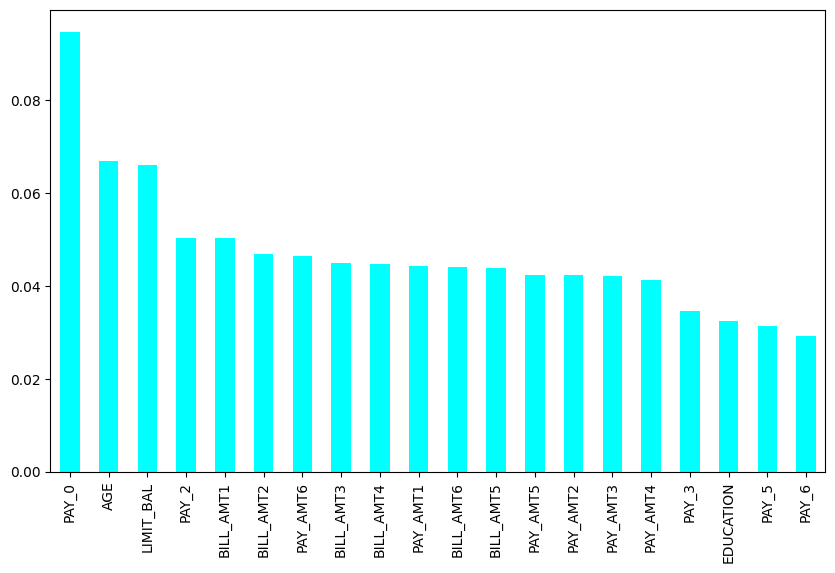

In [37]:
features = pd.Series(extr.feature_importances_, index = x.columns)
plt.figure(figsize=(10,6))
features.nlargest(20).plot(kind='bar', color='cyan')
#plt.savefig('score1.png')

<Axes: >

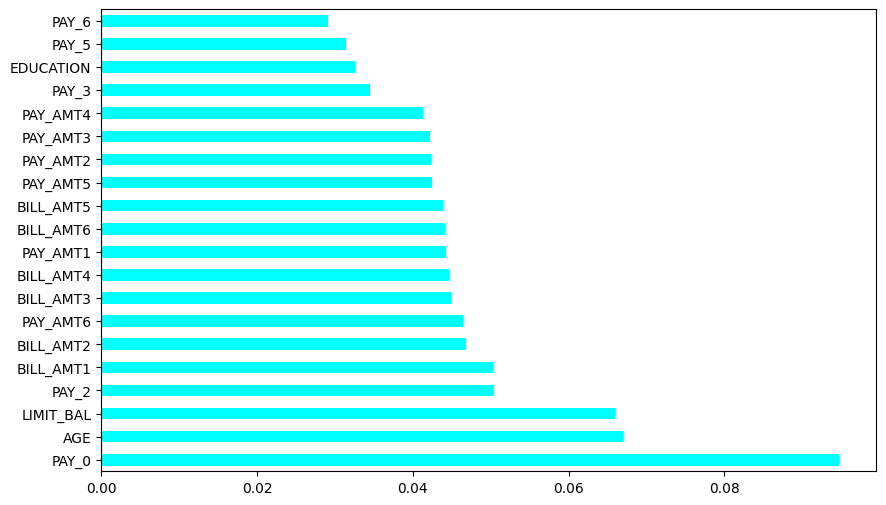

In [38]:
features = pd.Series(extr.feature_importances_, index = x.columns)
plt.figure(figsize=(10,6))
features.nlargest(20).plot(kind='barh', color='cyan') #bar=vertical but barh = horizontal
#plt.savefig('score1.png')

In [39]:
#x = newx
x.corr()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
LIMIT_BAL,1.000000,0.024755,-0.219161,-0.108139,0.144713,-0.271214,-0.296382,-0.286123,-0.267460,-0.249411,...,0.283236,0.293988,0.295562,0.290389,0.195236,0.178408,0.210167,0.203242,0.217202,0.219595
SEX,0.024755,1.000000,0.014232,-0.031389,-0.090874,-0.057643,-0.070771,-0.066096,-0.060173,-0.055064,...,-0.024563,-0.021880,-0.017005,-0.016733,-0.000242,-0.001391,-0.008597,-0.002229,-0.001667,-0.002766
EDUCATION,-0.219161,0.014232,1.000000,-0.143464,0.175061,0.105364,0.121566,0.114025,0.108793,0.097520,...,0.013002,-0.000451,-0.007567,-0.009099,-0.037456,-0.030038,-0.039943,-0.038218,-0.040358,-0.037200
MARRIAGE,-0.108139,-0.031389,-0.143464,1.000000,-0.414170,0.019917,0.024199,0.032688,0.033122,0.035629,...,-0.024909,-0.023344,-0.025393,-0.021207,-0.005979,-0.008093,-0.003541,-0.012659,-0.001205,-0.006641
AGE,0.144713,-0.090874,0.175061,-0.414170,1.000000,-0.039447,-0.050148,-0.053048,-0.049722,-0.053826,...,0.053710,0.051353,0.049345,0.047613,0.026147,0.021785,0.029247,0.021379,0.022850,0.019478
PAY_0,-0.271214,-0.057643,0.105364,0.019917,-0.039447,1.000000,0.672164,0.574245,0.538841,0.509426,...,0.179785,0.179125,0.180635,0.176980,-0.079269,-0.070101,-0.070561,-0.064005,-0.058190,-0.058673
PAY_2,-0.296382,-0.070771,0.121566,0.024199,-0.050148,0.672164,1.000000,0.766552,0.662067,0.622780,...,0.224146,0.222237,0.221348,0.219403,-0.080701,-0.058990,-0.055901,-0.046858,-0.037093,-0.036500
PAY_3,-0.286123,-0.066096,0.114025,0.032688,-0.053048,0.574245,0.766552,1.000000,0.777359,0.686775,...,0.227494,0.227202,0.225145,0.222327,0.001295,-0.066793,-0.053311,-0.046067,-0.035863,-0.035861
PAY_4,-0.267460,-0.060173,0.108793,0.033122,-0.049722,0.538841,0.662067,0.777359,1.000000,0.819835,...,0.244983,0.245917,0.242902,0.239154,-0.009362,-0.001944,-0.069235,-0.043461,-0.033590,-0.026565
PAY_5,-0.249411,-0.055064,0.097520,0.035629,-0.053826,0.509426,0.622780,0.686775,0.819835,1.000000,...,0.243335,0.271915,0.269783,0.262509,-0.006089,-0.003191,0.009062,-0.058299,-0.033337,-0.023027


In [40]:
x.describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,3.000000e+04,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000
mean,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,-0.266200,...,4.701315e+04,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567
std,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,1.133187,...,6.934939e+04,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775
min,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-1.572640e+05,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000
25%,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2.666250e+03,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000
50%,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.008850e+04,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000
75%,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,6.016475e+04,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000
max,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,1.664089e+06,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000


In [41]:
 x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

<Axes: >

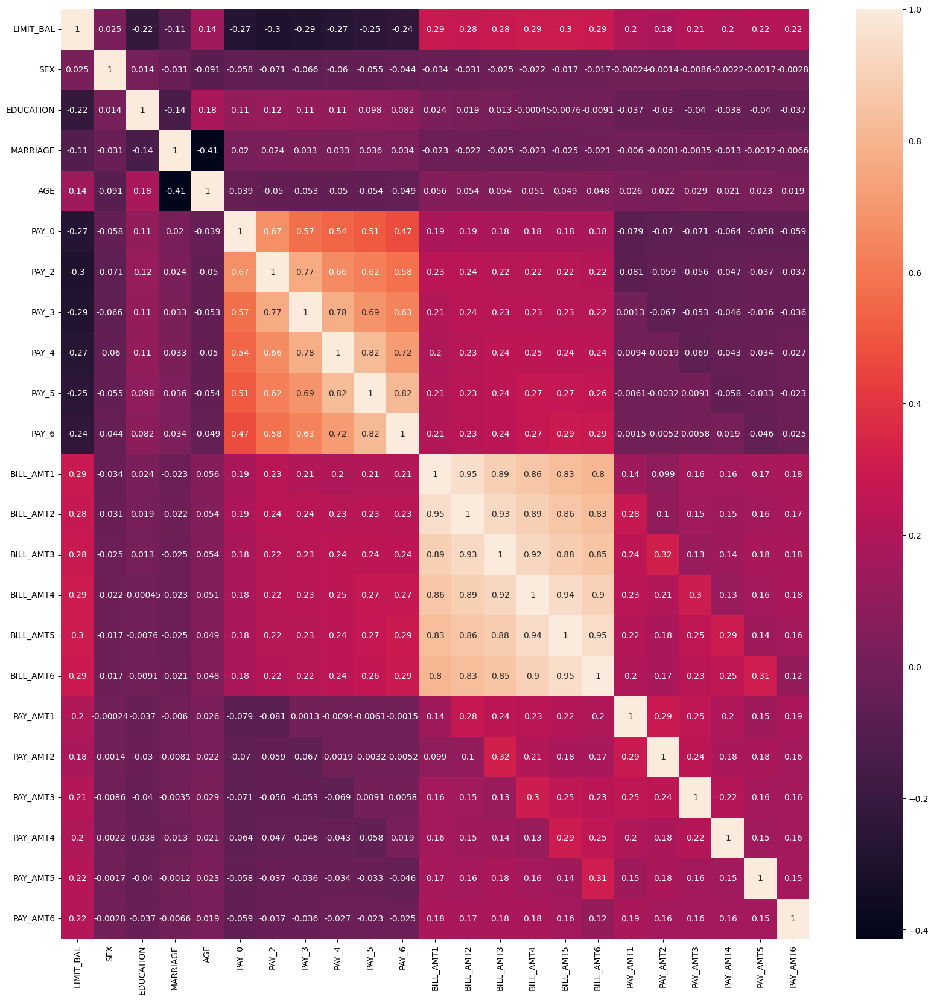

In [42]:
feature_names = x.columns #features name
colname = x.corr().index #features name
plt.figure(figsize=(20,20))
sns.heatmap(df[colname].corr(),annot=True)

Select K Best

In [43]:
df = pd.read_csv("credit card.csv")
df = df.rename(columns={'default.payment.next.month':'payment'})
x = df.drop(['ID','payment'],axis=1)
y = df['payment']

In [44]:
x.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0


In [45]:
from sklearn.feature_selection import SelectKBest, f_classif, chi2, f_regression #chi2 only when features are non negative

In [46]:
model2 = SelectKBest(score_func=f_classif)

In [47]:
feature_score = model2.fit(x,y)

In [48]:
feature_score.scores_

array([7.24068539e+02, 4.79788543e+01, 2.35471118e+01, 1.77812714e+01,
       5.78855582e+00, 3.53771497e+03, 2.23916914e+03, 1.75746644e+03,
       1.47684597e+03, 1.30459118e+03, 1.08540249e+03, 1.15805315e+01,
       6.04423789e+00, 5.94438771e+00, 3.09474518e+00, 1.37108740e+00,
       8.65820292e-01, 1.60403810e+02, 1.03291524e+02, 9.52180109e+01,
       9.71880005e+01, 9.14298008e+01, 8.50890453e+01])

In [49]:
cols = pd.DataFrame(feature_score.scores_ , columns=['Feature_Scores'])
cols

,Feature_Scores
0,724.068539
1,47.978854
2,23.547112
3,17.781271
4,5.788556
5,3537.714970
6,2239.169136
7,1757.466444
8,1476.845967
9,1304.591176


In [50]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [51]:
col2 = pd.DataFrame(x.columns, columns=['Feature_Names'])
col2.head()

,Feature_Names
0,LIMIT_BAL
1,SEX
2,EDUCATION
3,MARRIAGE
4,AGE


In [52]:
scores = pd.concat([col2,cols],axis=1)
scores

,Feature_Names,Feature_Scores
0,LIMIT_BAL,724.068539
1,SEX,47.978854
2,EDUCATION,23.547112
3,MARRIAGE,17.781271
4,AGE,5.788556
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176


In [53]:
scores.nlargest(18,'Feature_Scores')

,Feature_Names,Feature_Scores
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176
10,PAY_6,1085.402485
0,LIMIT_BAL,724.068539
17,PAY_AMT1,160.403810
18,PAY_AMT2,103.291524
20,PAY_AMT4,97.188000


In [54]:
df3 = df.drop(['LIMIT_BAL','EDUCATION','PAY_0'], axis=1)

In [55]:
df3.to_csv('new.csv')

In [56]:
scores = pd.concat([col2,cols],axis=1)
scores

,Feature_Names,Feature_Scores
0,LIMIT_BAL,724.068539
1,SEX,47.978854
2,EDUCATION,23.547112
3,MARRIAGE,17.781271
4,AGE,5.788556
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176


In [57]:
newx = scores.nlargest(15,'Feature_Scores')
newx

,Feature_Names,Feature_Scores
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176
10,PAY_6,1085.402485
0,LIMIT_BAL,724.068539
17,PAY_AMT1,160.403810
18,PAY_AMT2,103.291524
20,PAY_AMT4,97.188000


PCA

In [58]:
df = pd.read_csv("credit card.csv")
df = df.rename(columns={'default.payment.next.month':'payment'})
x = df.drop(['ID','payment'],axis=1)
y = df['payment']

In [59]:
x

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000.0,1,3,1,39,0,0,0,0,0,...,208365.0,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0
29996,150000.0,1,3,2,43,-1,-1,-1,-1,0,...,3502.0,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0
29997,30000.0,1,2,2,37,4,3,2,-1,0,...,2758.0,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0
29998,80000.0,1,3,1,41,1,-1,0,0,0,...,76304.0,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0


In [60]:
from sklearn.preprocessing import MinMaxScaler

In [61]:
mmax =MinMaxScaler() #feature range=(2,5)

In [62]:
scaled_x =mmax.fit_transform(x)

In [63]:
scaled_x.shape

(30000, 23)

In [64]:
scaled_x

array([[0.01010101, 1.        , 0.33333333, ..., 0.        , 0.        ,
        0.        ],
       [0.11111111, 1.        , 0.33333333, ..., 0.00161031, 0.        ,
        0.00378311],
       [0.08080808, 1.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00945777],
       ...,
       [0.02020202, 0.        , 0.33333333, ..., 0.00676329, 0.00468901,
        0.00586382],
       [0.07070707, 0.        , 0.5       , ..., 0.00310145, 0.12417444,
        0.00341236],
       [0.04040404, 0.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00189155]])

In [65]:
from sklearn.decomposition import PCA

In [67]:
pca =PCA(n_components=3)
x_pca =pca.fit_transform (scaled_x)
x_pca

array([[-0.40423245, -0.00800476, -0.00259672],
       [-0.39188881,  0.209224  , -0.19698759],
       [-0.39264215,  0.08409527, -0.12656657],
       ...,
       [ 0.62351265,  0.33728837, -0.08489179],
       [ 0.60374479, -0.01953153,  0.214211  ],
       [ 0.60917214,  0.0099741 ,  0.23321988]])

In [69]:
features =pd.DataFrame(x_pca,columns=['pca1','pca2','pca3'])
features.head()

,pca1,pca2,pca3
0,-0.404232,-0.008005,-0.002597
1,-0.391889,0.209224,-0.196988
2,-0.392642,0.084095,-0.126567
3,-0.394038,0.068885,0.154030
4,0.610813,-0.089679,0.334445


In [72]:
import plotly.express as pl
pl.scatter_3d(features, x='pca1',y='pca2',z='pca3', color='pca1')